In [22]:
import os
import mne
import numpy as np
from glob import glob
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [3]:
fif_dir = 'data'
fif_files = sorted(glob(os.path.join(fif_dir, 'subj0*_session*_epo.fif')))

all_epochs = []
file_names = []

for fif_file in fif_files:
    file_name = os.path.basename(fif_file)
    epochs = mne.read_epochs(fif_file)
    file_names.append(file_name)
    all_epochs.append(epochs)

Reading c:\Users\marty\OneDrive\Documents\Code\data\subj01_session1_epo.fif ...
    Found the data of interest:
        t =     -50.78 ...     599.61 ms
        0 CTF compensation matrices available
Not setting metadata
3838 matching events found
No baseline correction applied
0 projection items activated
Reading c:\Users\marty\OneDrive\Documents\Code\data\subj01_session2_epo.fif ...
    Found the data of interest:
        t =     -50.78 ...     599.61 ms
        0 CTF compensation matrices available
Not setting metadata
3837 matching events found
No baseline correction applied
0 projection items activated
Reading c:\Users\marty\OneDrive\Documents\Code\data\subj03_session2_epo.fif ...
    Found the data of interest:
        t =     -50.78 ...     599.61 ms
        0 CTF compensation matrices available
Not setting metadata
3818 matching events found
No baseline correction applied
0 projection items activated
Reading c:\Users\marty\OneDrive\Documents\Code\data\subj04_session1_epo.fif ...

In [5]:
concatenated_epochs = mne.concatenate_epochs(all_epochs)

Not setting metadata
38261 matching events found
Applying baseline correction (mode: mean)


No projector specified for this dataset. Please consider the method self.add_proj.


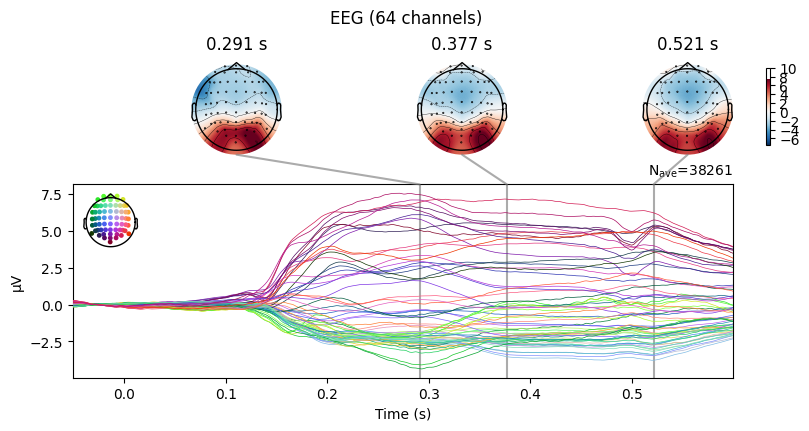

In [23]:
# grand average per channel across all sessions
grand_average = concatenated_epochs.average()  # Compute grand average across all event types
fig = grand_average.plot_joint()

No projector specified for this dataset. Please consider the method self.add_proj.


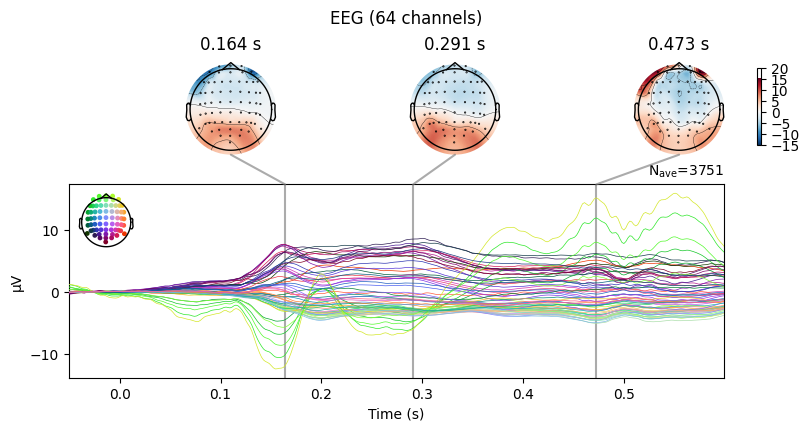

In [26]:
# Looking into the suspicious session
subj04_session1_epo = all_epochs[3]
grand_average_subj04_session1_epo = subj04_session1_epo.average()
fig = grand_average_subj04_session1_epo.plot_joint()
plt.show()

In [50]:
bad_channels =  ['Fp1', 'Fp2', 'AF7', 'AF3', 'AF4', 'AF8', 'F7', 'F3', 'Fz', 'F4', 'F8',
                    'FT7', 'FC3', 'FCz', 'FC4', 'FT8']
subj04_session1_epo.info['bads'] = bad_channels

for ch_name in bad_channels:
    if ch_name in subj04_session1_epo.ch_names:
        data = subj04_session1_epo.get_data(picks=ch_name)
        print(f"Channel: {ch_name}, Mean: {data.mean()}, Variance: {data.var()}")
    else:
        print(f"Channel {ch_name} not found in the data.")

Channel: Fp1, Mean: 7.567208069415229e-07, Variance: 3.436596897363869e-10
Channel: Fp2, Mean: -1.7462834223787905e-06, Variance: 4.236549917194133e-11
Channel: AF7, Mean: 1.607000560003149e-06, Variance: 6.263726477389439e-10
Channel: AF3, Mean: -1.9965775245033517e-06, Variance: 3.482574797759169e-11
Channel: AF4, Mean: -2.3251571549374503e-06, Variance: 4.209154569987884e-11
Channel: AF8, Mean: 2.3221588239874585e-06, Variance: 1.3791175670499441e-09
Channel: F7, Mean: 3.102780883392032e-07, Variance: 2.413806009081829e-10
Channel: F3, Mean: -2.0903333063059636e-06, Variance: 3.5495975059693776e-11
Channel: Fz, Mean: -2.5144220216358475e-06, Variance: 3.546772893560018e-11
Channel: F4, Mean: -2.5374056664747146e-06, Variance: 2.902619607257729e-11
Channel: F8, Mean: -1.3692062234934585e-06, Variance: 5.072372845731451e-11
Channel: FT7, Mean: 4.956450943621485e-08, Variance: 1.1307655452105028e-10
Channel: FC3, Mean: -1.8549391991728354e-06, Variance: 2.859200956697825e-11
Channel: F

SessionID: subj01_session1_epo.fif
No projector specified for this dataset. Please consider the method self.add_proj.


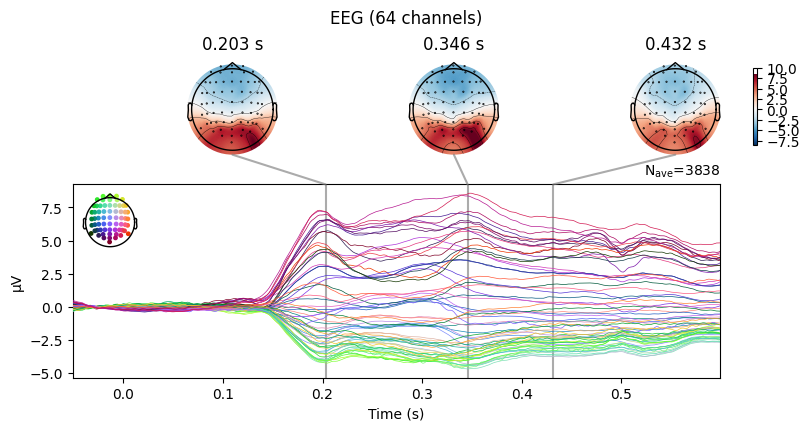

SessionID: subj01_session2_epo.fif
No projector specified for this dataset. Please consider the method self.add_proj.


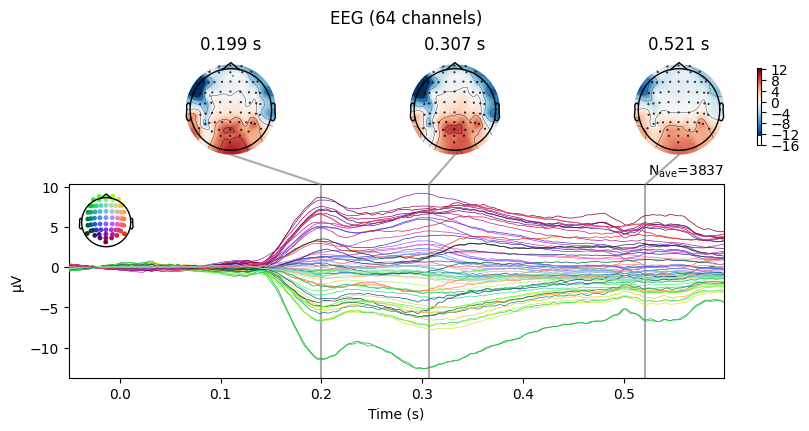

SessionID: subj03_session2_epo.fif
No projector specified for this dataset. Please consider the method self.add_proj.


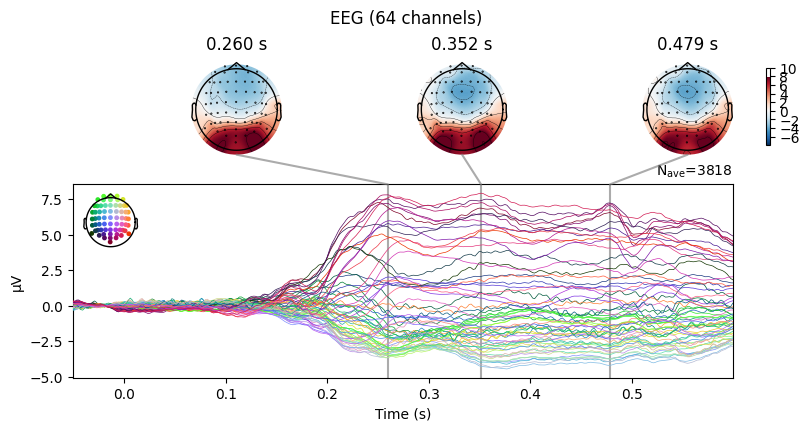

SessionID: subj04_session1_epo.fif
No projector specified for this dataset. Please consider the method self.add_proj.


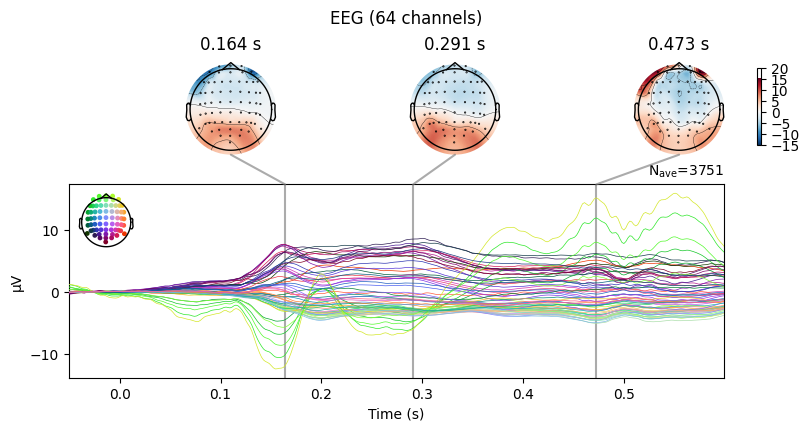

SessionID: subj04_session2_epo.fif
No projector specified for this dataset. Please consider the method self.add_proj.


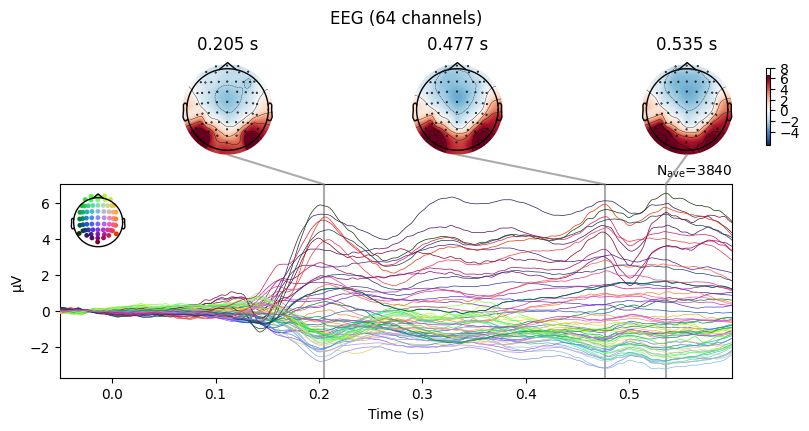

SessionID: subj05_session1_epo.fif
No projector specified for this dataset. Please consider the method self.add_proj.


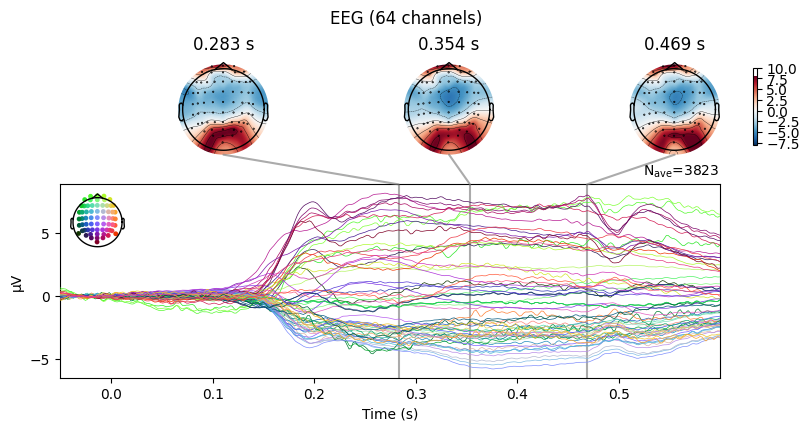

SessionID: subj06_session1_epo.fif
No projector specified for this dataset. Please consider the method self.add_proj.


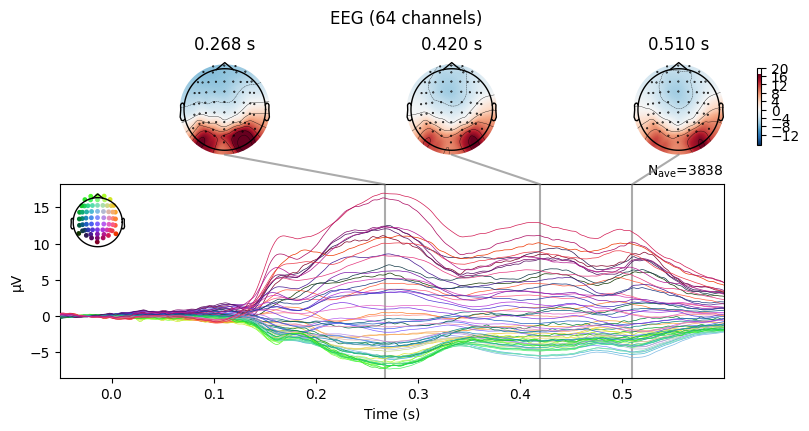

SessionID: subj06_session2_epo.fif
No projector specified for this dataset. Please consider the method self.add_proj.


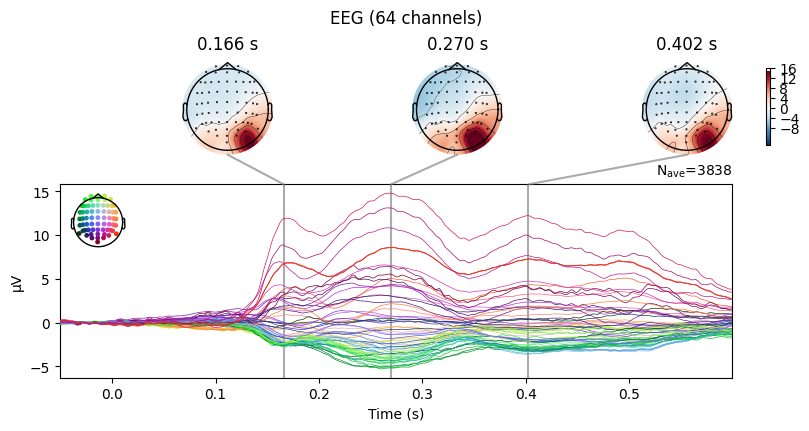

SessionID: subj07_session1_epo.fif
No projector specified for this dataset. Please consider the method self.add_proj.


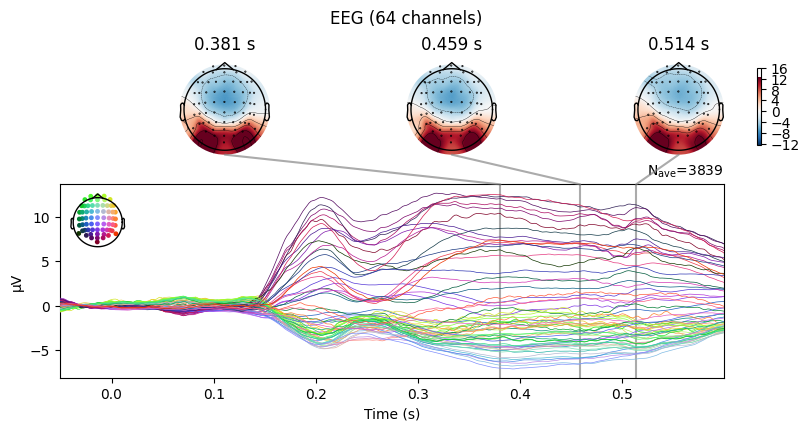

SessionID: subj08_session1_epo.fif
No projector specified for this dataset. Please consider the method self.add_proj.


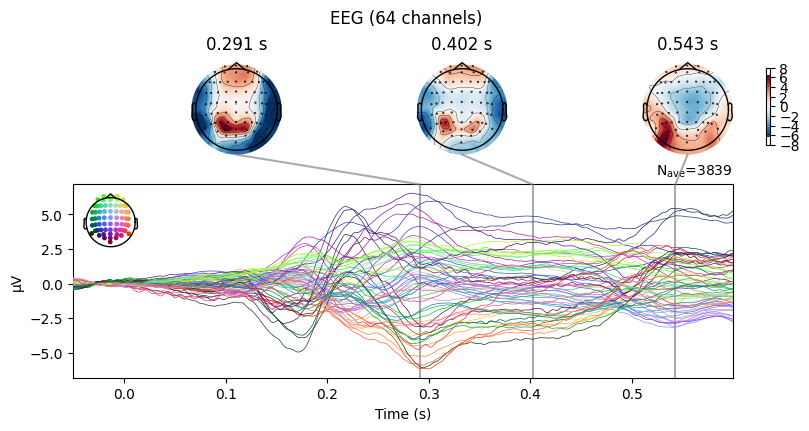

In [24]:
# QA sessions: plot grand average 
for i, session in enumerate(all_epochs):
    session_name = file_names[i]
    grand_average = session.average()
    print(f"SessionID: {session_name}")
    fig = grand_average.plot_joint()
    plt.show()

In [11]:
events = concatenated_epochs.events
unique_events, event_counts = np.unique(events[:, -1], return_counts=True)
print("Event types and occurrences:")
for event_type, count in zip(unique_events, event_counts):
    print(f"Event type {event_type}: {count} occurrences")

Event types and occurrences:
Event type 1: 40 occurrences
Event type 2: 40 occurrences
Event type 3: 40 occurrences
Event type 4: 40 occurrences
Event type 5: 40 occurrences
Event type 6: 40 occurrences
Event type 7: 40 occurrences
Event type 8: 40 occurrences
Event type 9: 40 occurrences
Event type 10: 40 occurrences
Event type 11: 40 occurrences
Event type 12: 40 occurrences
Event type 13: 40 occurrences
Event type 14: 40 occurrences
Event type 15: 40 occurrences
Event type 16: 40 occurrences
Event type 17: 40 occurrences
Event type 18: 40 occurrences
Event type 19: 40 occurrences
Event type 20: 40 occurrences
Event type 21: 40 occurrences
Event type 22: 40 occurrences
Event type 23: 40 occurrences
Event type 24: 40 occurrences
Event type 25: 40 occurrences
Event type 26: 40 occurrences
Event type 27: 40 occurrences
Event type 28: 40 occurrences
Event type 29: 40 occurrences
Event type 30: 40 occurrences
Event type 31: 40 occurrences
Event type 32: 40 occurrences
Event type 33: 40 oc

In [12]:
event_datasets = []
for event_type in unique_events:
    event_epochs = concatenated_epochs[event_type]
    event_datasets.append(event_epochs)

print(f"Number of datasets created: {len(event_datasets)}")

Number of datasets created: 960


Computing rank from data with rank=None
    Using tolerance 1.8e-09 (2.2e-16 eps * 64 dim * 1.3e+05  max singular value)
    Estimated rank (eeg): 64
    EEG: rank 64 computed from 64 data channels with 0 projectors
Reducing data rank from 64 -> 64
Estimating covariance using SHRUNK
Done.
Estimating covariance using DIAGONAL_FIXED
    EEG regularization : 0.1
Done.
Estimating covariance using EMPIRICAL
Done.
Using cross-validation to select the best estimator.
    EEG regularization : 0.1
    EEG regularization : 0.1
    EEG regularization : 0.1
Number of samples used : 12779174
log-likelihood on unseen data (descending order):
   shrunk: -188.767
   diagonal_fixed: -195.668
   empirical: -207.681
selecting best estimator: shrunk
[done]
Computing rank from covariance with rank=None
    Using tolerance 1.9e-13 (2.2e-16 eps * 64 dim * 13  max singular value)
    Estimated rank (eeg): 64
    EEG: rank 64 computed from 64 data channels with 0 projectors


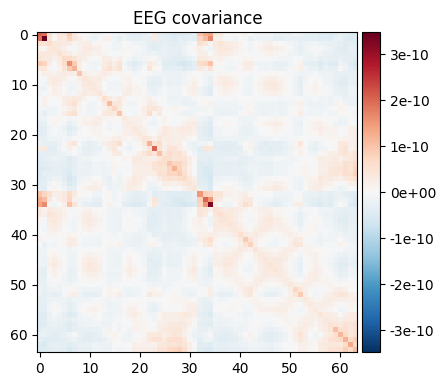

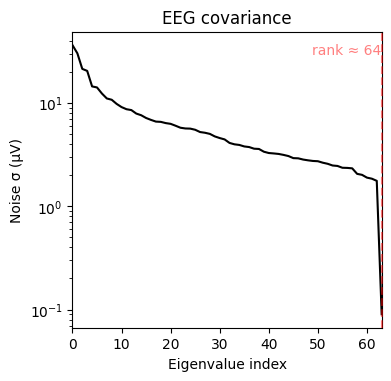

(<Figure size 380x370 with 2 Axes>, <Figure size 380x370 with 1 Axes>)

In [19]:
# Compute the covariance matrix
cov = mne.compute_covariance(concatenated_epochs, method='auto')
mne.viz.plot_cov(cov, concatenated_epochs.info)

No projector specified for this dataset. Please consider the method self.add_proj.


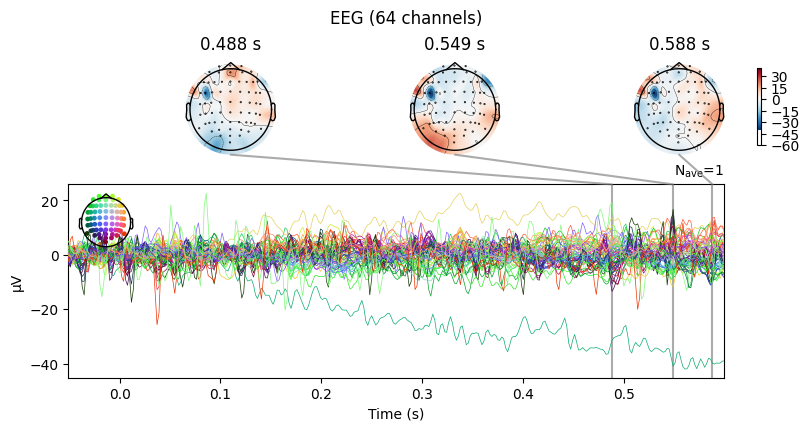

Event ID: 0
No projector specified for this dataset. Please consider the method self.add_proj.


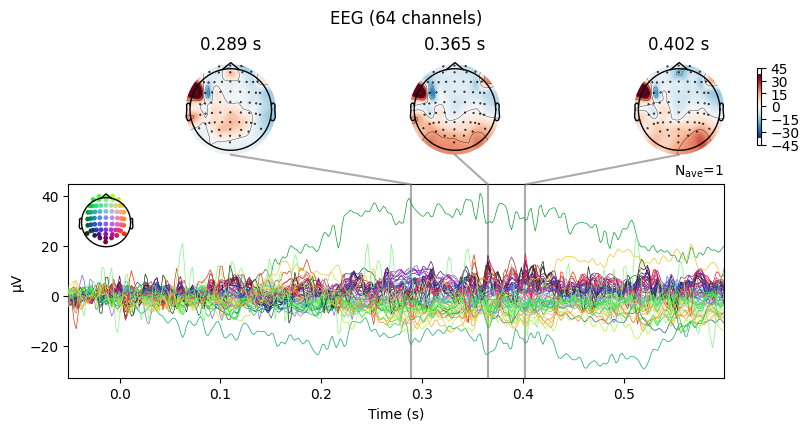

Event ID: 1
No projector specified for this dataset. Please consider the method self.add_proj.


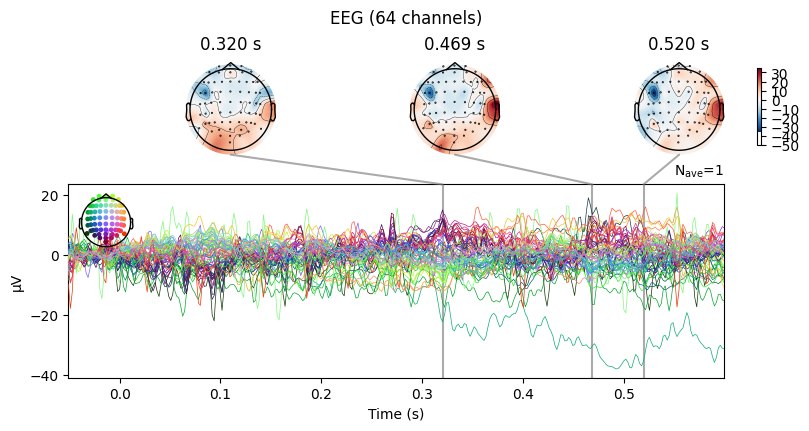

Event ID: 2
No projector specified for this dataset. Please consider the method self.add_proj.


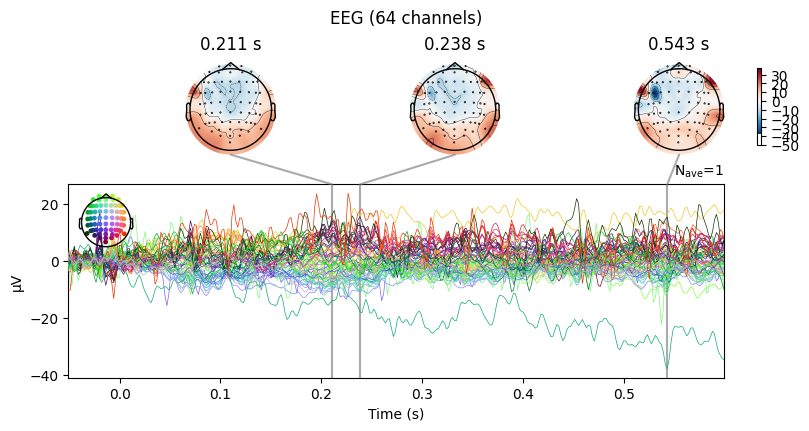

Event ID: 3
No projector specified for this dataset. Please consider the method self.add_proj.


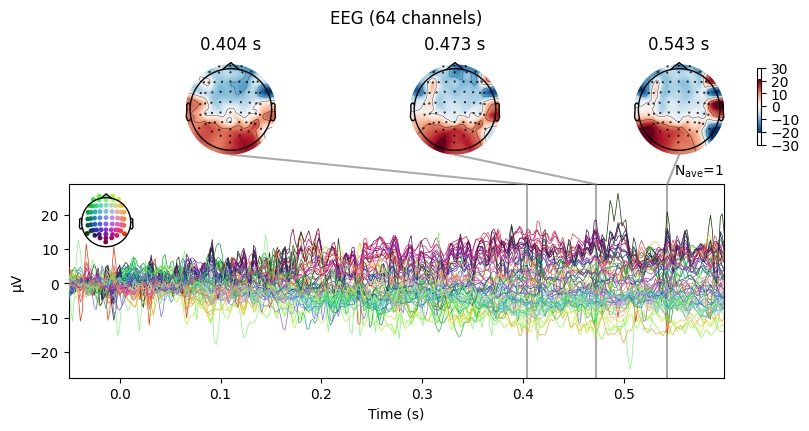

Event ID: 4
No projector specified for this dataset. Please consider the method self.add_proj.


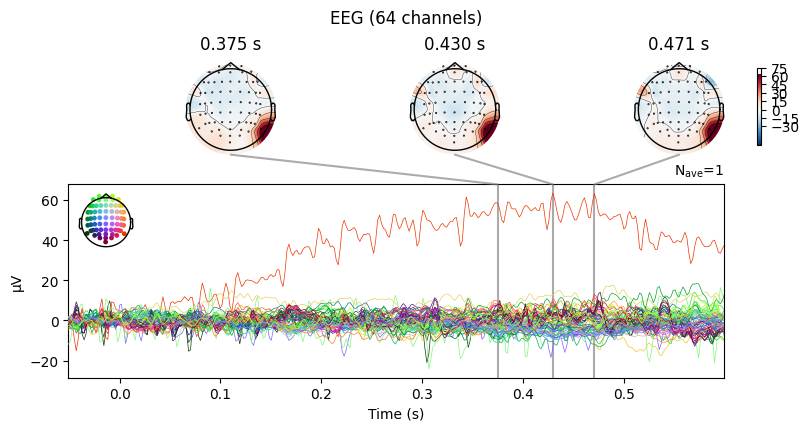

Event ID: 5
No projector specified for this dataset. Please consider the method self.add_proj.


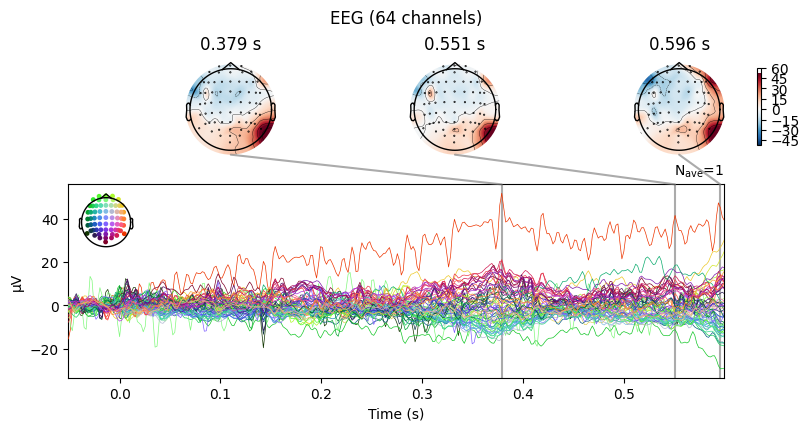

Event ID: 6
No projector specified for this dataset. Please consider the method self.add_proj.


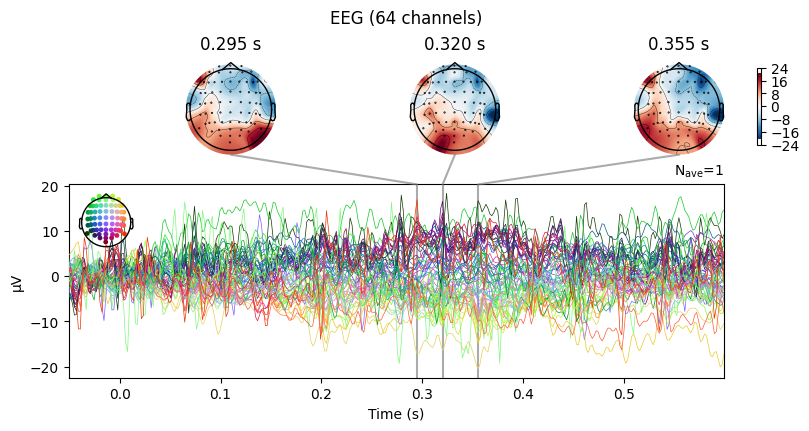

Event ID: 7
No projector specified for this dataset. Please consider the method self.add_proj.


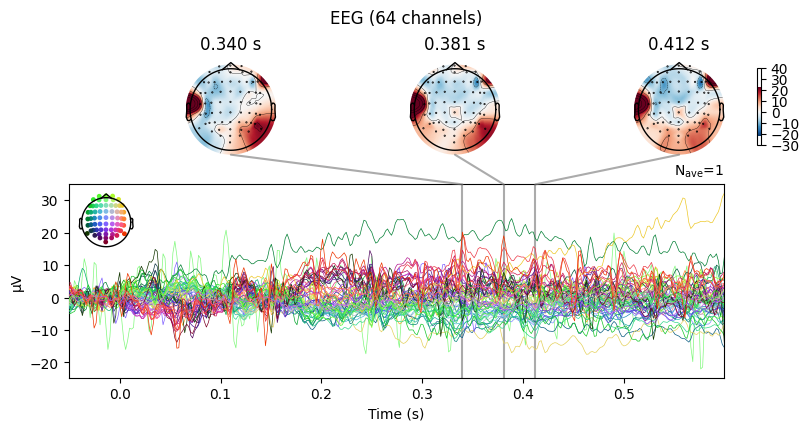

Event ID: 8
No projector specified for this dataset. Please consider the method self.add_proj.


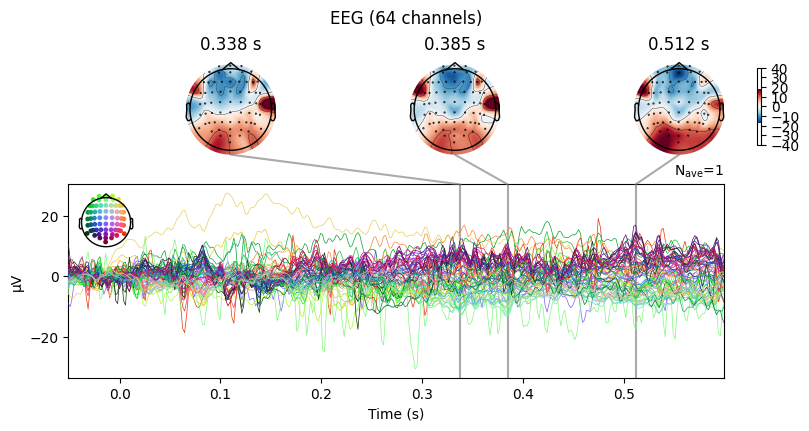

Event ID: 9
No projector specified for this dataset. Please consider the method self.add_proj.


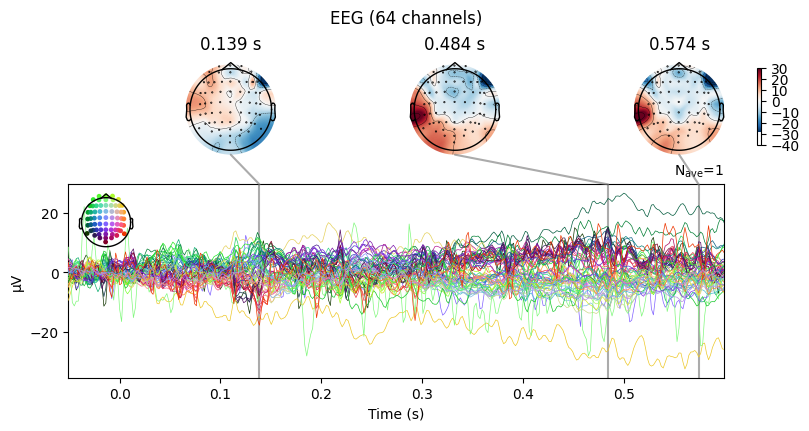

Event ID: 10
No projector specified for this dataset. Please consider the method self.add_proj.


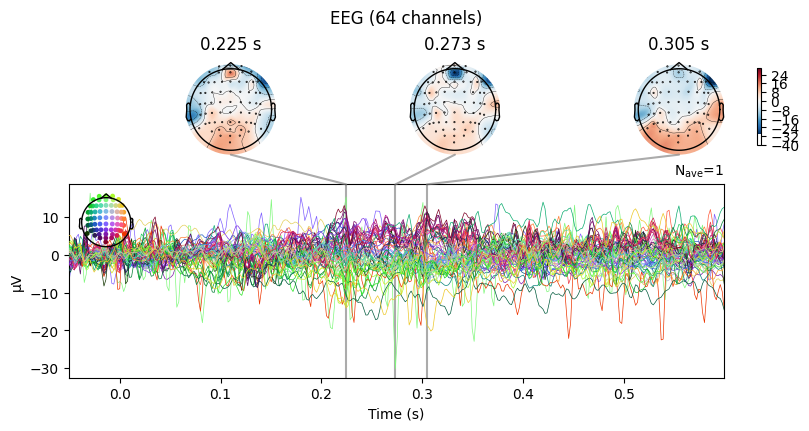

Event ID: 11
No projector specified for this dataset. Please consider the method self.add_proj.


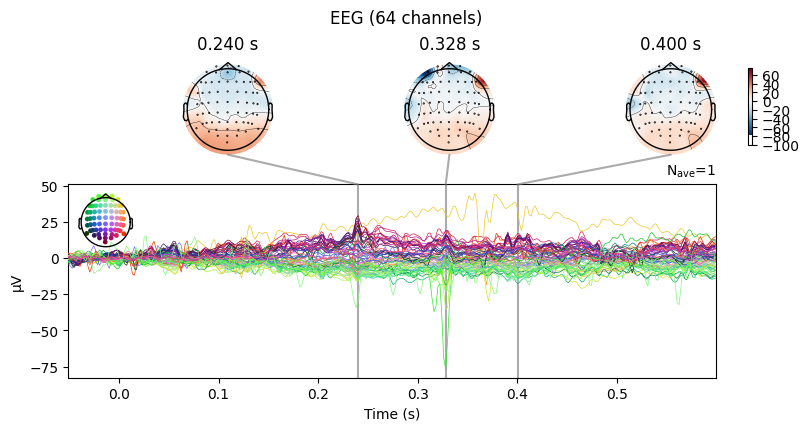

Event ID: 12
No projector specified for this dataset. Please consider the method self.add_proj.


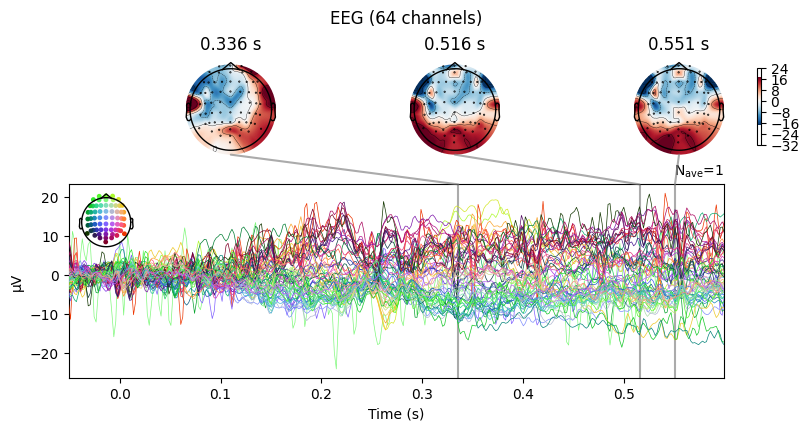

Event ID: 13
No projector specified for this dataset. Please consider the method self.add_proj.


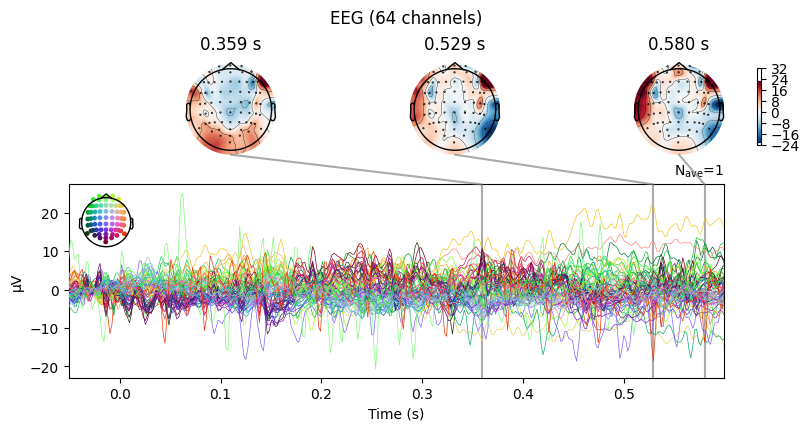

Event ID: 14
No projector specified for this dataset. Please consider the method self.add_proj.


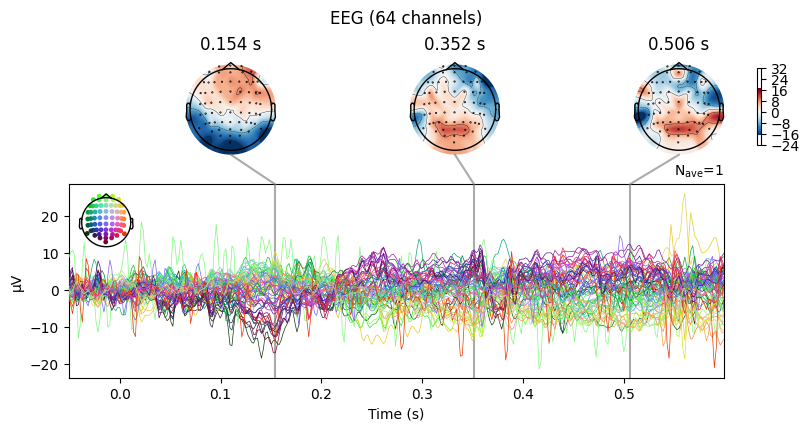

Event ID: 15
No projector specified for this dataset. Please consider the method self.add_proj.


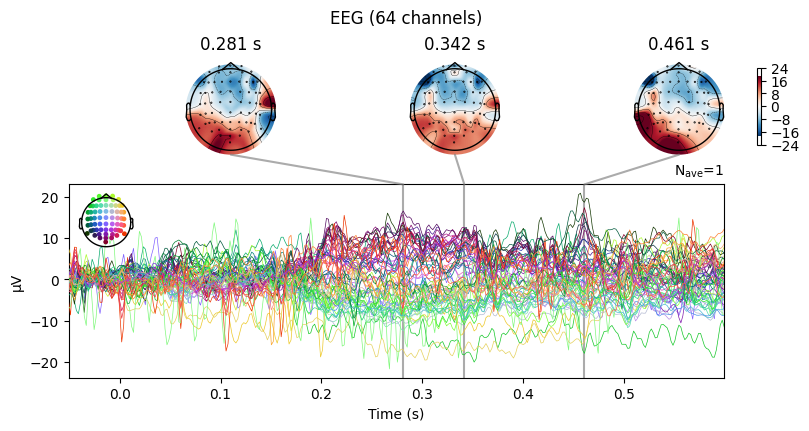

Event ID: 16
No projector specified for this dataset. Please consider the method self.add_proj.


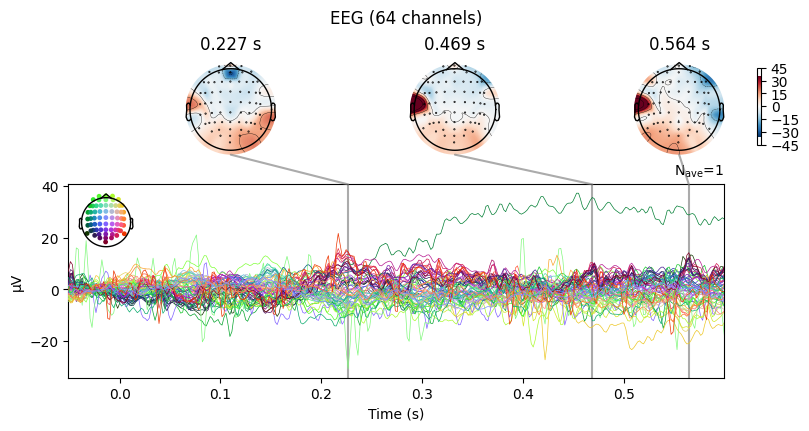

Event ID: 17
No projector specified for this dataset. Please consider the method self.add_proj.


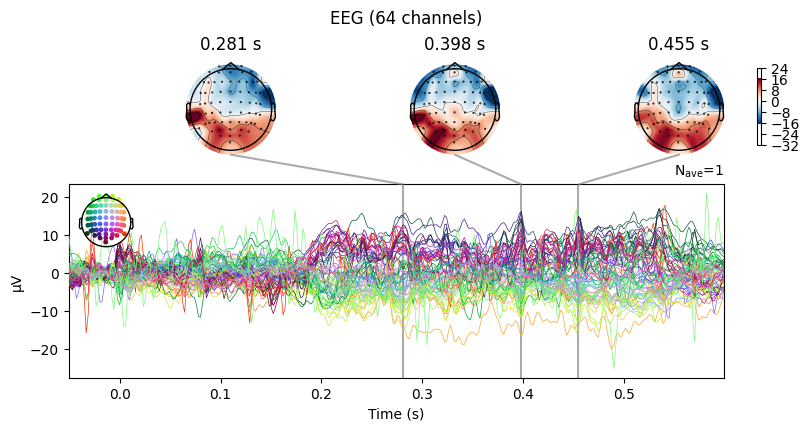

Event ID: 18
No projector specified for this dataset. Please consider the method self.add_proj.


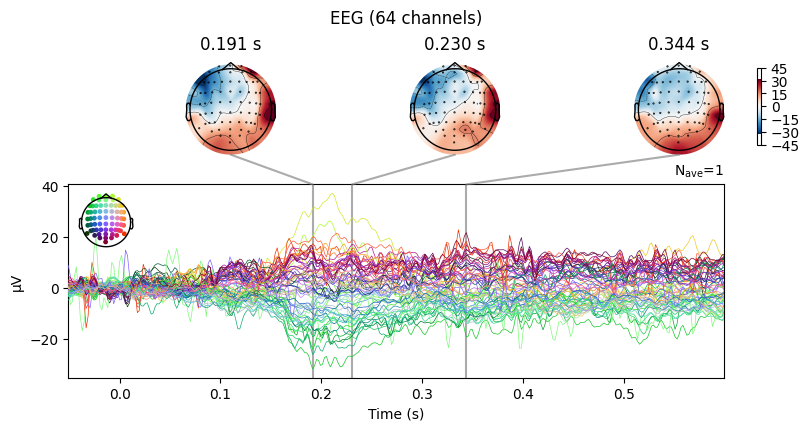

Event ID: 19
No projector specified for this dataset. Please consider the method self.add_proj.


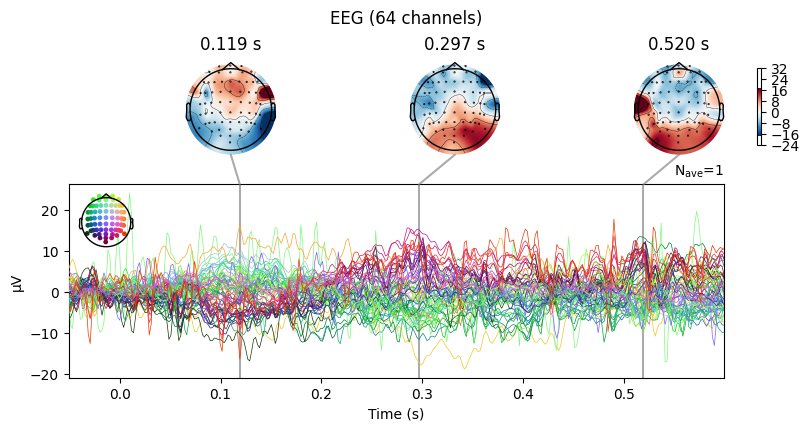

Event ID: 20
No projector specified for this dataset. Please consider the method self.add_proj.


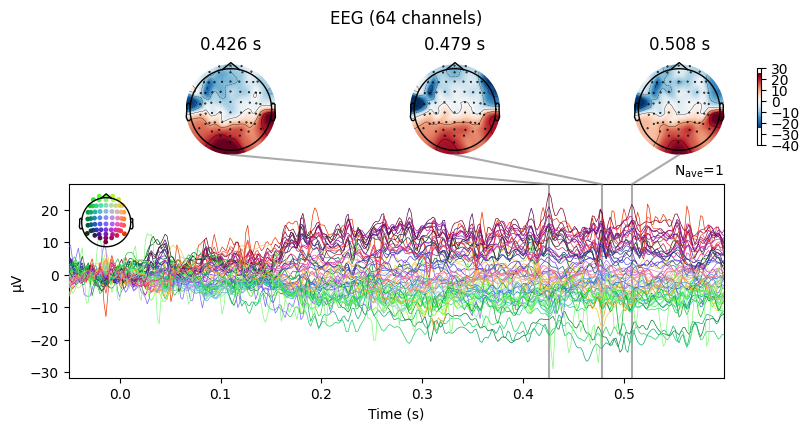

Event ID: 21
No projector specified for this dataset. Please consider the method self.add_proj.


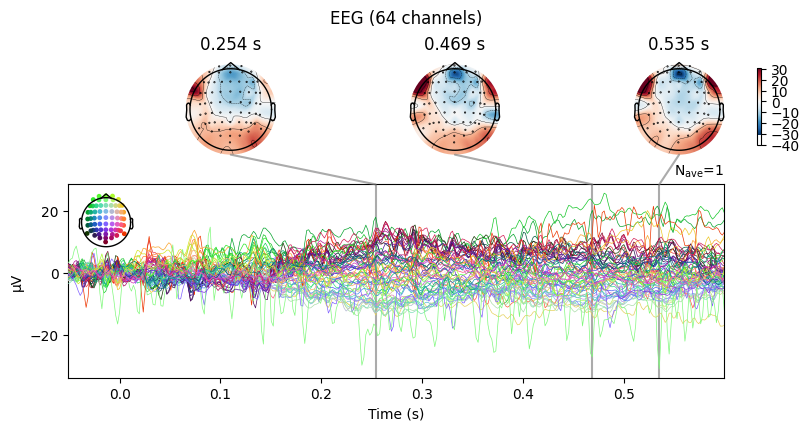

Event ID: 22
No projector specified for this dataset. Please consider the method self.add_proj.


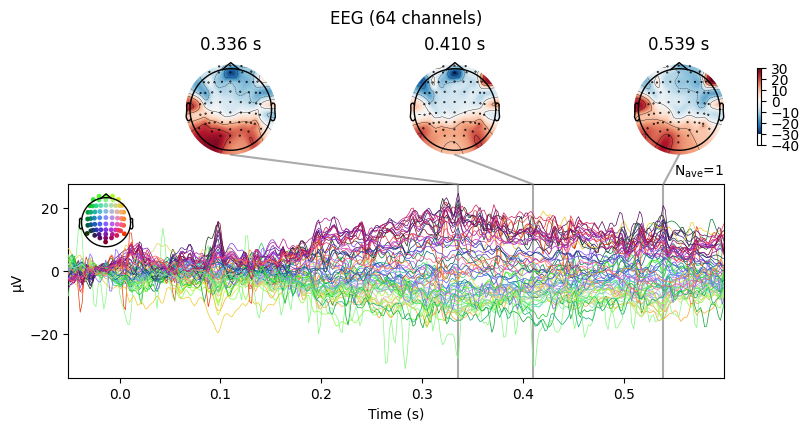

Event ID: 23
No projector specified for this dataset. Please consider the method self.add_proj.


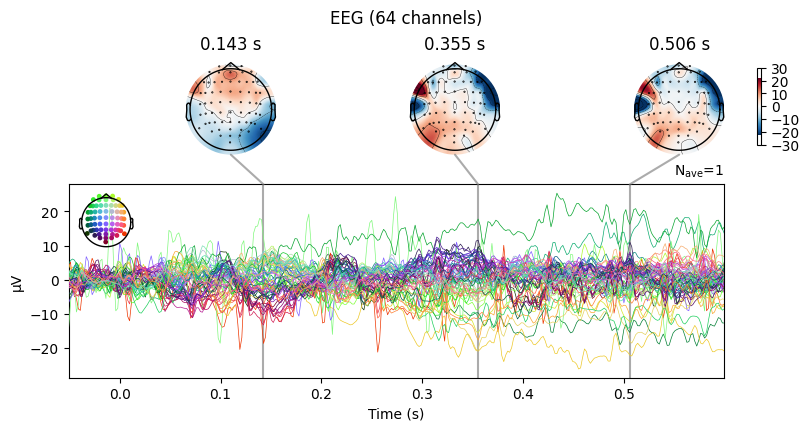

Event ID: 24
No projector specified for this dataset. Please consider the method self.add_proj.


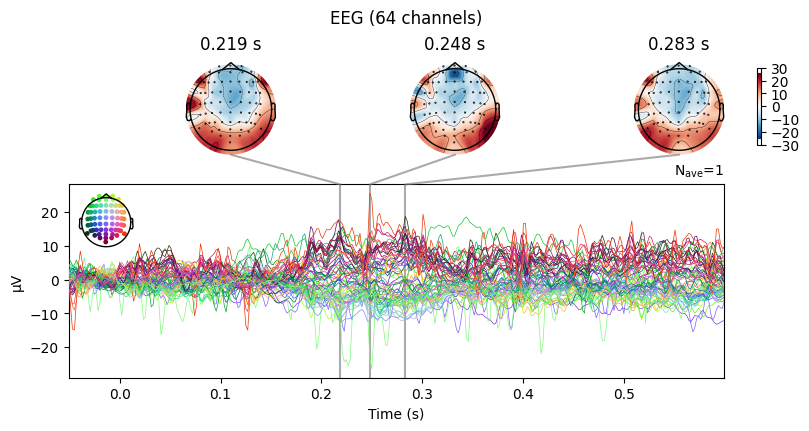

Event ID: 25
No projector specified for this dataset. Please consider the method self.add_proj.


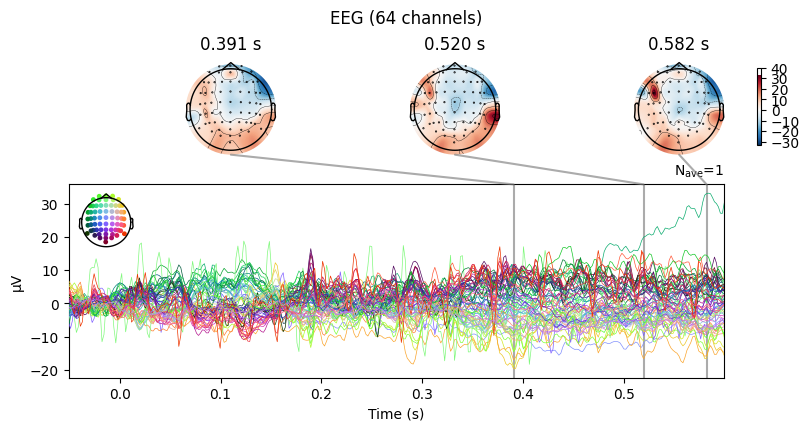

Event ID: 26
No projector specified for this dataset. Please consider the method self.add_proj.


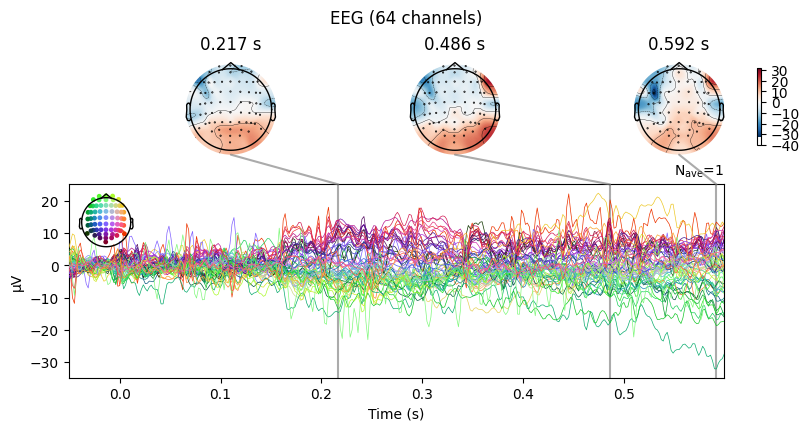

Event ID: 27
No projector specified for this dataset. Please consider the method self.add_proj.


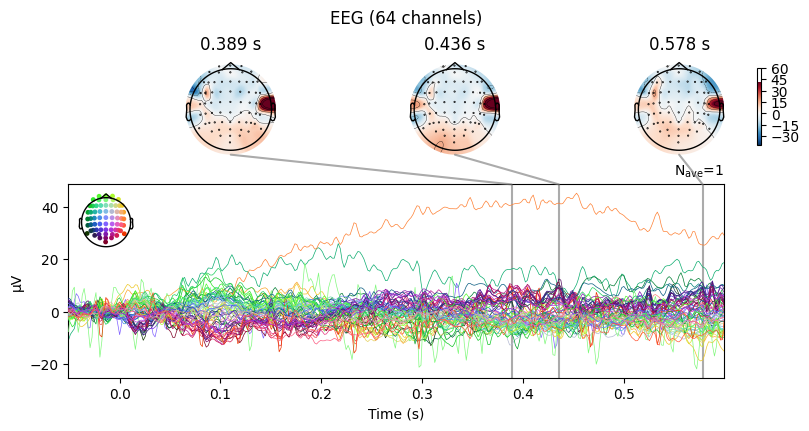

Event ID: 28
No projector specified for this dataset. Please consider the method self.add_proj.


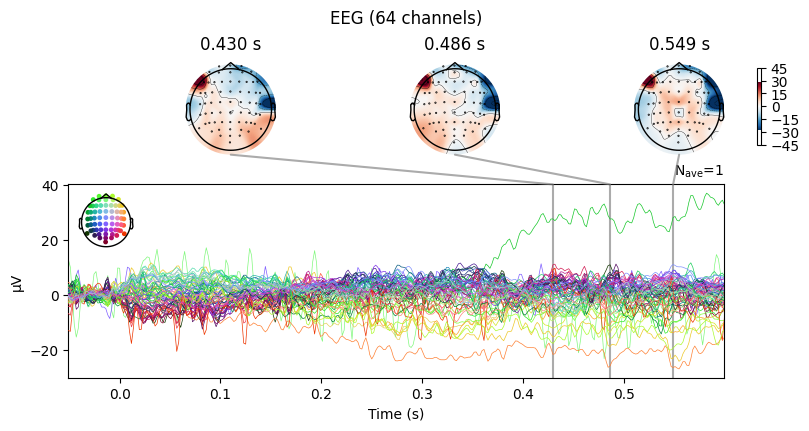

Event ID: 29
No projector specified for this dataset. Please consider the method self.add_proj.


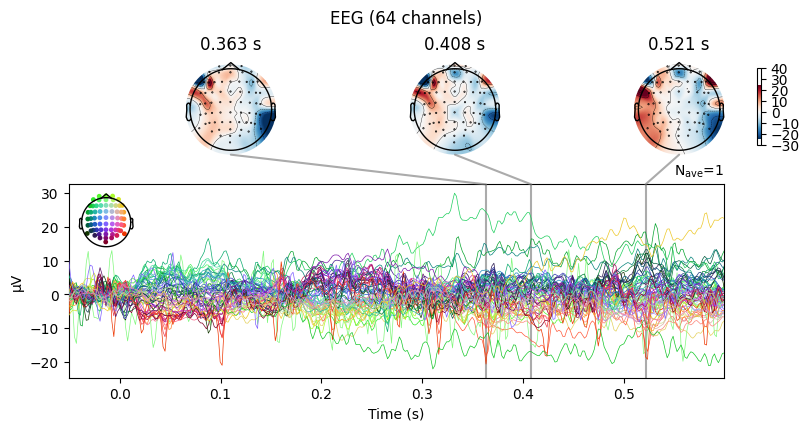

Event ID: 30
No projector specified for this dataset. Please consider the method self.add_proj.


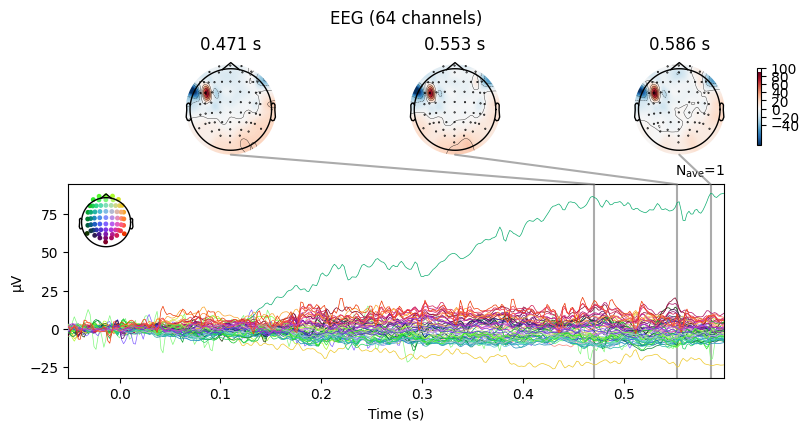

Event ID: 31
No projector specified for this dataset. Please consider the method self.add_proj.


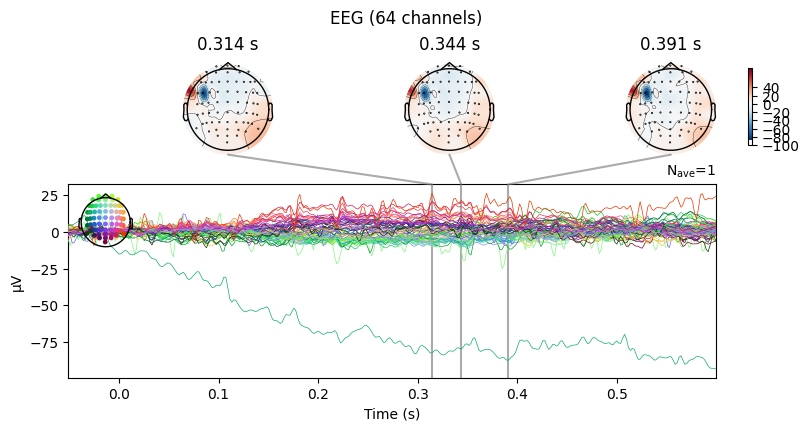

Event ID: 32
No projector specified for this dataset. Please consider the method self.add_proj.


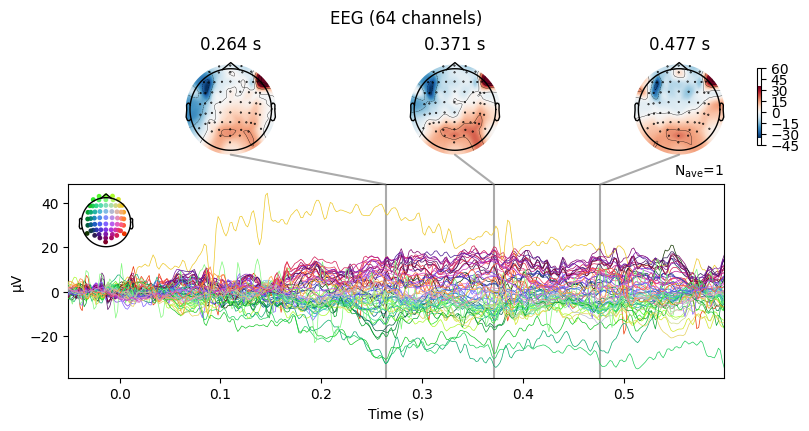

Event ID: 33
No projector specified for this dataset. Please consider the method self.add_proj.


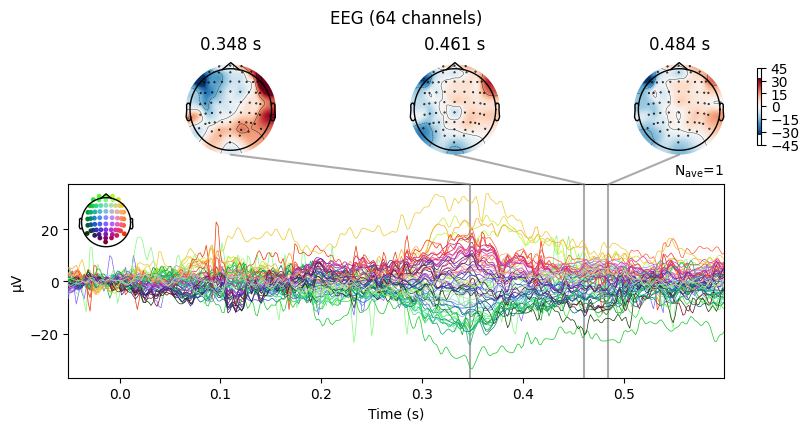

Event ID: 34
No projector specified for this dataset. Please consider the method self.add_proj.


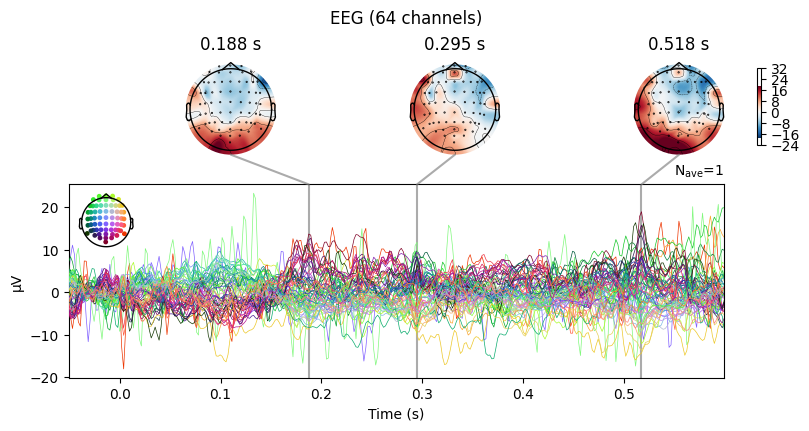

Event ID: 35
No projector specified for this dataset. Please consider the method self.add_proj.


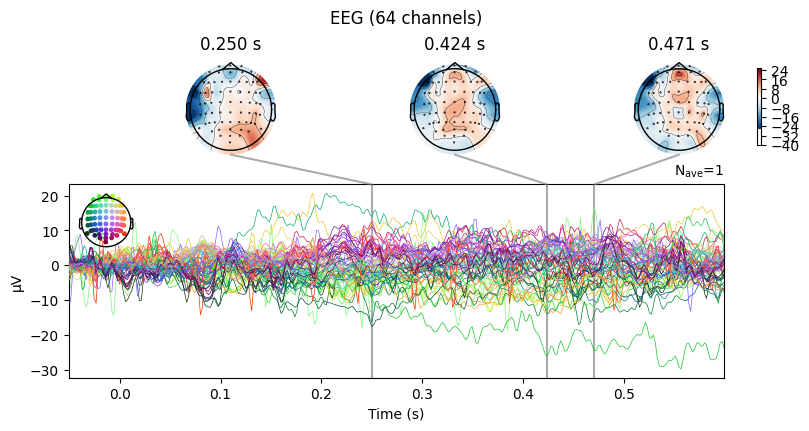

Event ID: 36
No projector specified for this dataset. Please consider the method self.add_proj.


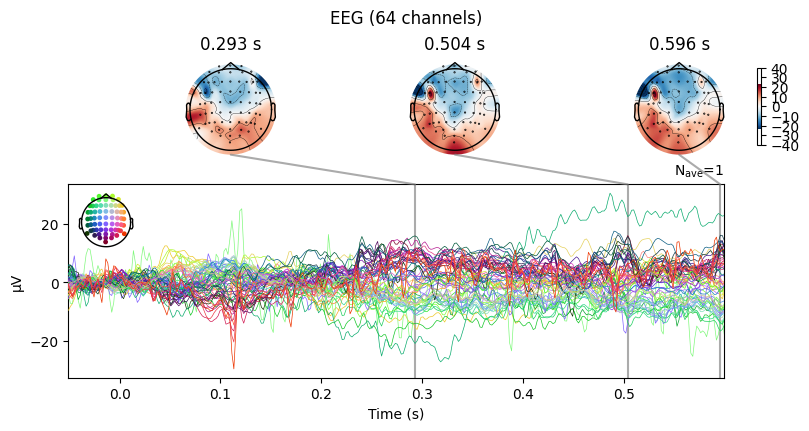

Event ID: 37
No projector specified for this dataset. Please consider the method self.add_proj.


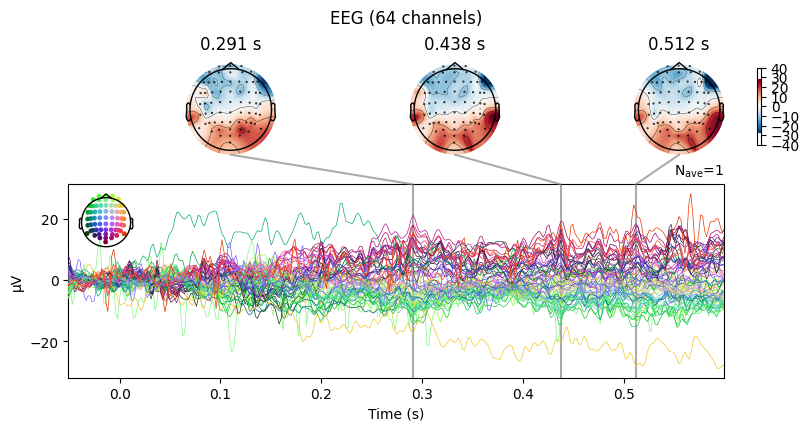

Event ID: 38
No projector specified for this dataset. Please consider the method self.add_proj.


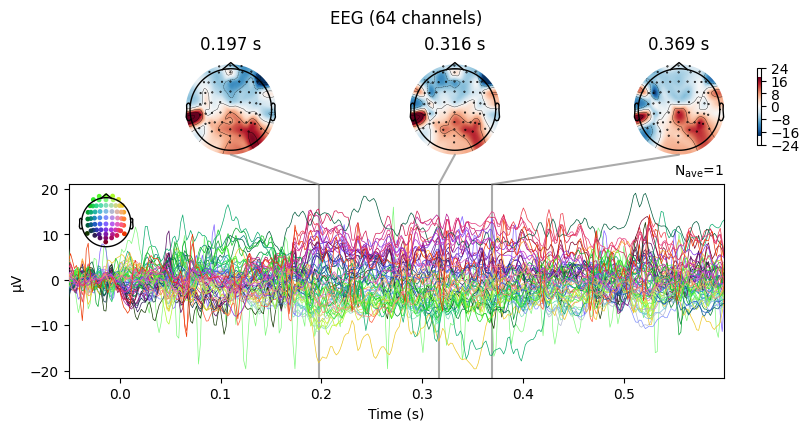

Event ID: 39
No projector specified for this dataset. Please consider the method self.add_proj.


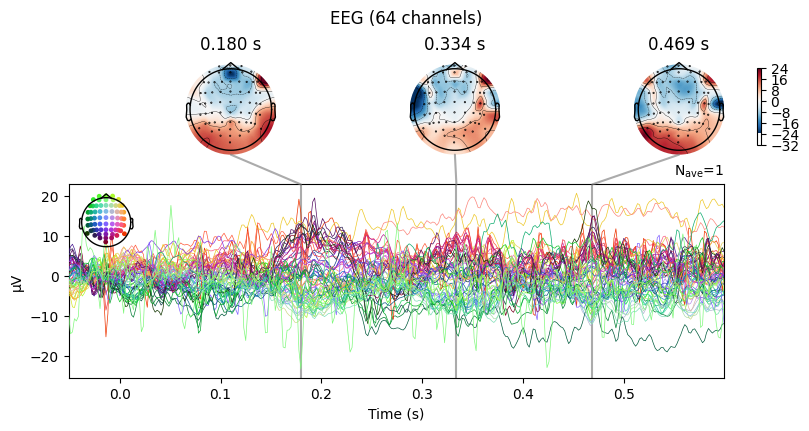

Event ID: 40
No projector specified for this dataset. Please consider the method self.add_proj.


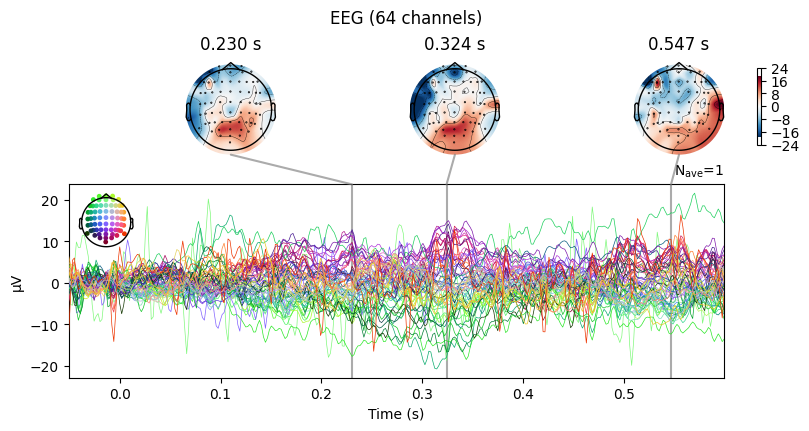

Event ID: 41
No projector specified for this dataset. Please consider the method self.add_proj.


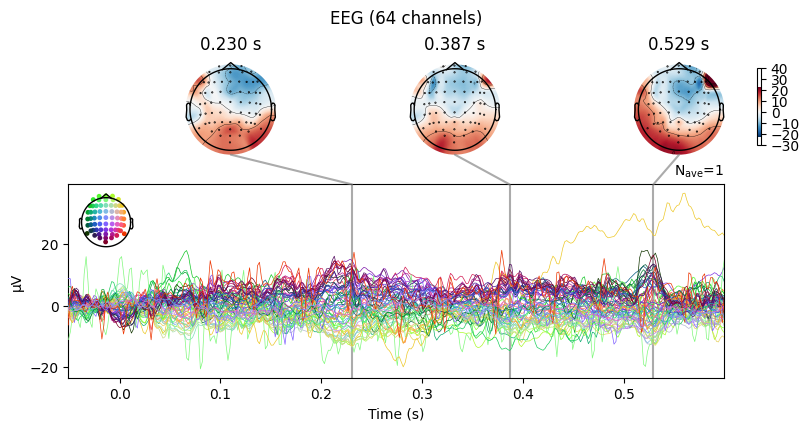

Event ID: 42
No projector specified for this dataset. Please consider the method self.add_proj.


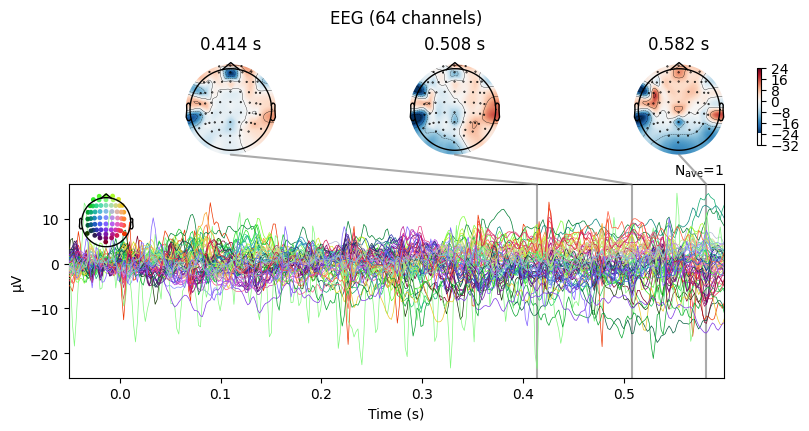

Event ID: 43
No projector specified for this dataset. Please consider the method self.add_proj.


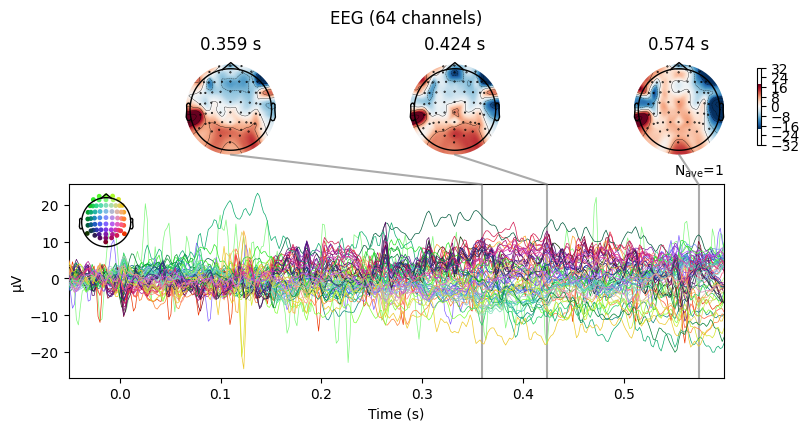

Event ID: 44
No projector specified for this dataset. Please consider the method self.add_proj.


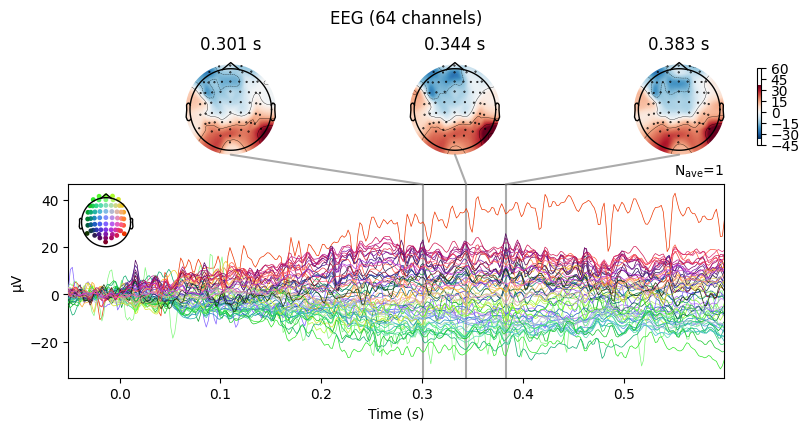

Event ID: 45
No projector specified for this dataset. Please consider the method self.add_proj.


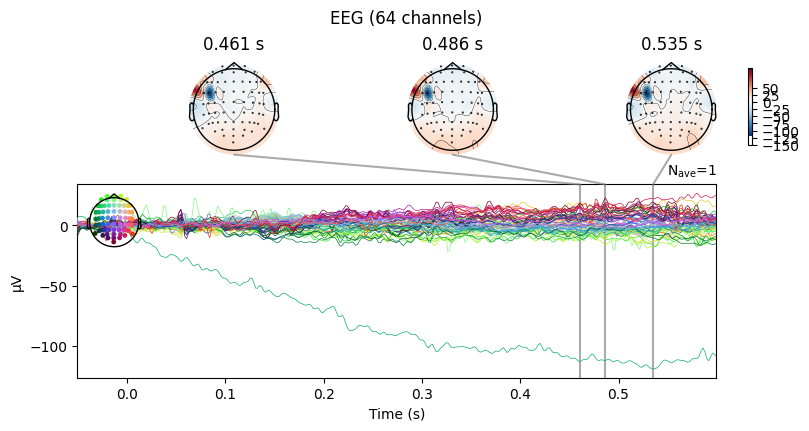

Event ID: 46
No projector specified for this dataset. Please consider the method self.add_proj.


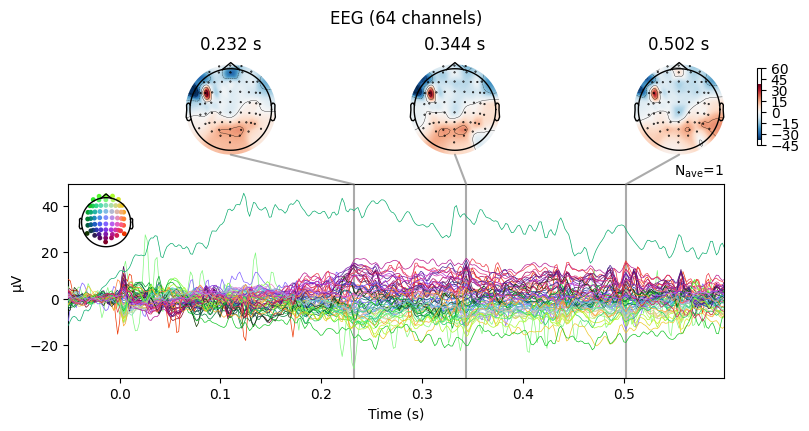

Event ID: 47
No projector specified for this dataset. Please consider the method self.add_proj.


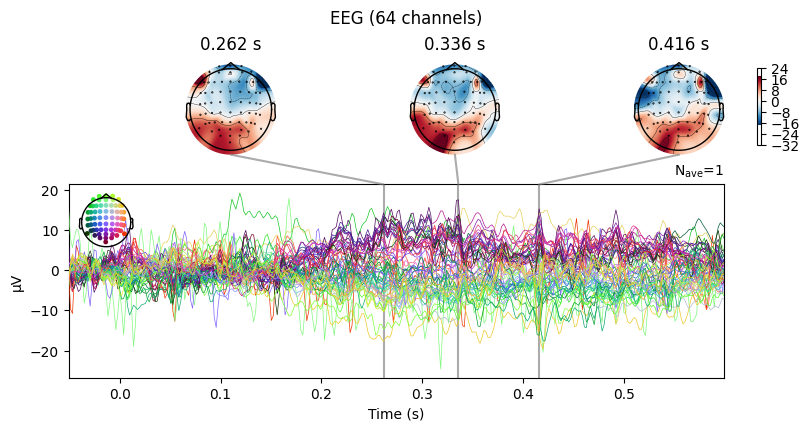

Event ID: 48
No projector specified for this dataset. Please consider the method self.add_proj.


KeyboardInterrupt: 

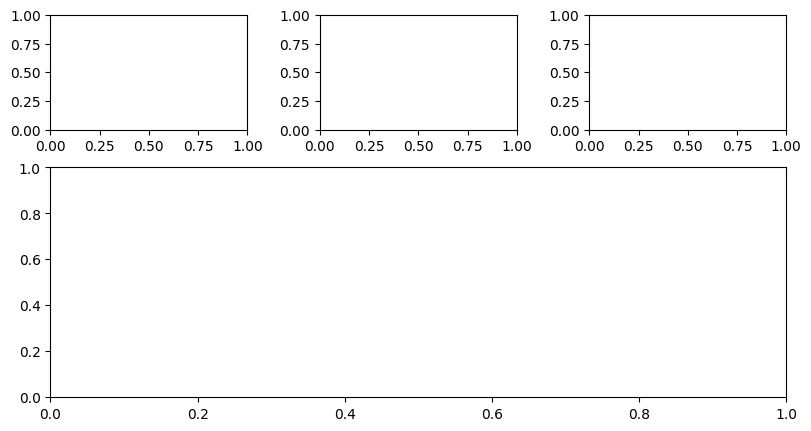

In [20]:
# QA sessions: plot grand average 
for i, session in enumerate(event_datasets):
    event_id = i
    grand_average = session.average()
    fig = grand_average.plot_joint()
    print(f"Event ID: {event_id}")
    plt.show()